Nama:

In [1]:
print("Rahman Aziz Firmansyah")

Rahman Aziz Firmansyah


In [6]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder, StandardScaler, MinMaxScaler, RobustScaler, MaxAbsScaler, OneHotEncoder, PolynomialFeatures
from sklearn.feature_selection import mutual_info_classif, SelectKBest, VarianceThreshold, mutual_info_regression
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.linear_model import LogisticRegression, LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.metrics import classification_report, confusion_matrix, recall_score, precision_score, precision_recall_curve, roc_auc_score, roc_curve, r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, silhouette_score
from sklearn.pipeline import make_pipeline
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, RandomForestRegressor
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids
from sklearn.decomposition import PCA
from kmodes.kmodes import KModes
from scipy.stats import spearmanr
import seaborn as sns
import matplotlib.pyplot as plt
import itertools
import time

A. Clustering Tanpa PCA

(1) Lakukan transformasi yang diperlukan pada dataset churn.

In [91]:
churn = pd.read_csv('churn.csv').drop('CLIENTNUM', axis=1)
churn.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [92]:
#mengecek missing value
churn.isna().sum()

Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

In [93]:
#persentase missing value pada education level
churn['Education_Level'].isna().sum() * 100/len(churn)

14.999506270366348

In [94]:
churn['Marital_Status'].isna().sum() * 100/len(churn)

7.3960699121161255

In [20]:
#copy data churn yang akan dimodifikasi
churn1 = churn.copy()

In [95]:
#handling missing value dengan simple imputer
simple_imputer = SimpleImputer(strategy='most_frequent')
churn1['Education_Level'] = simple_imputer.fit_transform(churn1[['Education_Level']])
churn1['Marital_Status'] = simple_imputer.fit_transform(churn1[['Marital_Status']])

In [96]:
#konfirmasi hasil imputasi
all(churn1.isna().sum() == 0)

True

In [97]:
#memisahkan fitur objek dan numerik
X_obj = churn1.select_dtypes('object')
X_num = churn1.select_dtypes('number')

In [98]:
X_num.head()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,label
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,6
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,6
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,6
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,6
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,6


In [99]:
X_obj.head()

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
0,Existing Customer,M,High School,Married,$60K - $80K,Blue
1,Existing Customer,F,Graduate,Single,Less than $40K,Blue
2,Existing Customer,M,Graduate,Married,$80K - $120K,Blue
3,Existing Customer,F,High School,Married,Less than $40K,Blue
4,Existing Customer,M,Uneducated,Married,$60K - $80K,Blue


In [101]:
#transformasi data kategorik dengan ordinal encoding
ord_enc = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=np.nan)
X_obj_transformed = pd.DataFrame(ord_enc.fit_transform(X_obj), columns=ord_enc.feature_names_in_)
X_obj_transformed.head()

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
0,1.0,1.0,3.0,1.0,2.0,0.0
1,1.0,0.0,2.0,2.0,4.0,0.0
2,1.0,1.0,2.0,1.0,3.0,0.0
3,1.0,0.0,3.0,1.0,4.0,0.0
4,1.0,1.0,5.0,1.0,2.0,0.0


In [102]:
#transformasi data numerik dengan robust scaler
#tujuan penggunaan robust scaler adalah agar transformasi data robust terhadap outlier
robsc = RobustScaler()
X_num_scaled = pd.DataFrame(robsc.fit_transform(X_num), columns=robsc.feature_names_in_)
X_num_scaled.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,label
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,0.029633,0.173102,-0.007955,-0.093710,0.341167,0.455317,0.479642,-0.079429,0.468116,0.105003,0.195353,-0.059481,0.043315,0.206028,-0.052780
std,0.728801,0.649454,0.887380,0.777204,1.010622,1.106225,1.067698,0.571921,1.065169,0.961433,1.313916,0.652016,1.008839,0.574357,0.505443
min,-1.818182,-1.000000,-2.555556,-1.500000,-2.000000,-2.000000,-0.365427,-0.895439,-0.406702,-3.228070,-1.310772,-1.583333,-2.974576,-0.366667,-1.000000
25%,-0.454545,-0.500000,-0.555556,-0.500000,0.000000,0.000000,-0.234244,-0.643509,-0.251860,-0.460526,-0.674338,-0.611111,-0.508475,-0.318750,-0.500000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.545455,0.500000,0.444444,0.500000,1.000000,1.000000,0.765756,0.356491,0.748140,0.539474,0.325662,0.388889,0.491525,0.681250,0.500000
max,2.454545,1.500000,2.222222,1.000000,4.000000,4.000000,3.520352,0.870877,3.637237,11.671053,5.641075,2.000000,12.762712,1.714583,0.500000


In [103]:
#menggabungkan data objek dan numerik
X_transformed = pd.concat([X_obj_transformed, X_num_scaled], axis=1)
X_transformed.head()

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,label
0,1.0,1.0,3.0,1.0,2.0,0.0,-0.090909,0.5,0.333333,0.5,...,1.0,0.956476,-0.350175,0.988927,2.627193,-1.065558,-0.694444,3.911017,-0.239583,0.5
1,1.0,0.0,2.0,2.0,4.0,0.0,0.272727,1.5,0.888889,1.0,...,0.0,0.435477,-0.289123,0.459078,3.530702,-1.008702,-0.944444,12.762712,-0.147917,0.5
2,1.0,1.0,2.0,1.0,3.0,0.0,0.454545,0.5,0.000000,0.0,...,-2.0,-0.132863,-0.895439,-0.006562,8.149123,-0.778186,-1.305556,6.911017,-0.366667,0.5
3,1.0,0.0,3.0,1.0,4.0,0.0,-0.545455,1.0,-0.222222,-0.5,...,-1.0,-0.145198,0.870877,-0.313785,2.934211,-1.055115,-1.305556,6.911017,1.216667,0.5
4,1.0,1.0,5.0,1.0,2.0,0.0,-0.545455,0.5,-1.666667,0.5,...,-2.0,0.019618,-0.895439,0.145527,6.311404,-1.192419,-1.083333,7.618644,-0.366667,0.5


(2) Buat model KMedoids dengan jumlah k yang ditentukan dengan menggunakan elbow method dan Sillhoette Score.

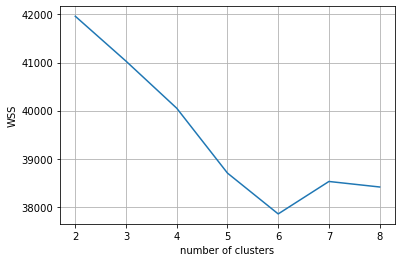

In [104]:
#memperkirakan jumlah klaster dengan within sums of squared terkecil
wss = []
n_clust = [2, 3, 4, 5, 6, 7, 8]
for clust in n_clust:
    kmedoids = KMedoids(n_clusters=clust)
    kmedoids.fit(X_transformed)
    wss.append(kmedoids.inertia_)
#buat plot wss terhadap penambahan klaster
sns.lineplot(x=n_clust, y=wss)
plt.xlabel('number of clusters')
plt.ylabel('WSS')
plt.grid()
plt.show()

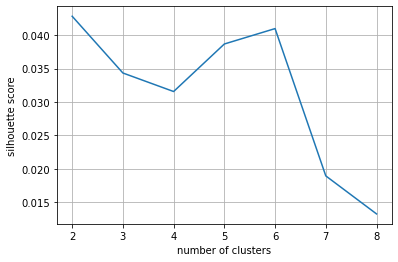

In [105]:
#memperkirakan jumlah klaster dengan sillhouetter score paling mendekati 1
#nilai ss menyatakan kekompakan klaster yang terbentuk
ss = []
n_clust = [2, 3, 4, 5, 6, 7, 8]
for clust in n_clust:
    kmedoids = KMedoids(n_clusters=clust)
    kmedoids.fit(X_transformed)
    ss.append(silhouette_score(X_transformed, kmedoids.labels_))
#buat plot silhouette score terhadap penambahan klaster
sns.lineplot(x=n_clust, y=ss)
plt.xlabel('number of clusters')
plt.ylabel('silhouette score')
plt.grid()
plt.show()

Berdasarkan pengamatan nilai WSS dan SS, maka dipilih jumlah klaster yang digunakan yaitu 6

In [106]:
kmedoids = KMedoids(n_clusters=6)
kmedoids.fit(X_num_scaled)

KMedoids(n_clusters=6)

(3) tambahkan kolom 'label' pada data sebelum transformasi berisi label yang didapatkan dari model clustering. Lakukan EDA: <p>
(a) joint plot untuk tiap pasangan numerik-numerik dengan hue cluster label<p>
(b) boxplot dan pointplot dengan cluster label sebagai nilai axis-x dan nilai variabel numerik sebagai nilai axis-y<p>
(c) stacked barplot untuk visualisasi hubungan fitur kategorikal dengan cluster label <p>
(d) tuliskan minimal 2 insights dari EDA yang Anda lakukan

In [107]:
X_num_scaled['label'] = kmedoids.labels_
print(X_num_scaled['label'].unique())
X_num_scaled.head()

[3 5 2 0 4 1]


,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,label
0,-0.090909,0.5,0.333333,0.5,-1.0,1.0,0.956476,-0.350175,0.988927,2.627193,-1.065558,-0.694444,3.911017,-0.239583,3
1,0.272727,1.5,0.888889,1.0,-1.0,0.0,0.435477,-0.289123,0.459078,3.530702,-1.008702,-0.944444,12.762712,-0.147917,3
2,0.454545,0.5,0.000000,0.0,-1.0,-2.0,-0.132863,-0.895439,-0.006562,8.149123,-0.778186,-1.305556,6.911017,-0.366667,3
3,-0.545455,1.0,-0.222222,-0.5,2.0,-1.0,-0.145198,0.870877,-0.313785,2.934211,-1.055115,-1.305556,6.911017,1.216667,3
4,-0.545455,0.5,-1.666667,0.5,-1.0,-2.0,0.019618,-0.895439,0.145527,6.311404,-1.192419,-1.083333,7.618644,-0.366667,3


In [108]:
churn1['label'] = kmedoids.labels_
churn1.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,label
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,...,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,3
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,...,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,3
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,...,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,3
3,Existing Customer,40,F,4,High School,Married,Less than $40K,Blue,34,3,...,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,3
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,...,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,3


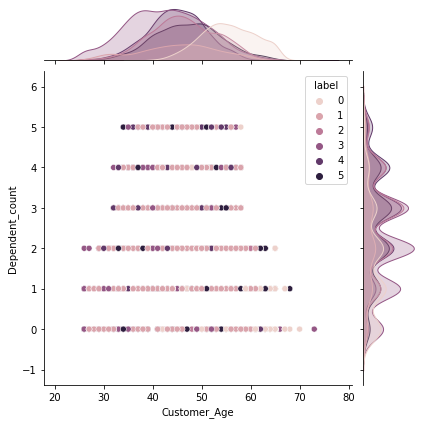

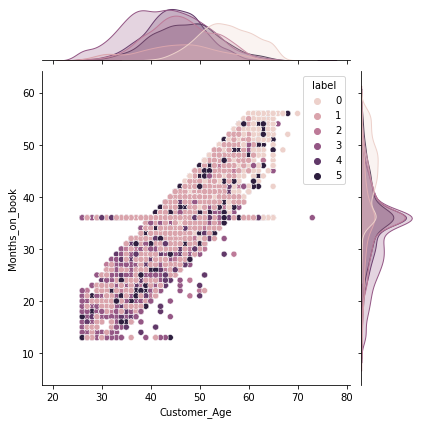

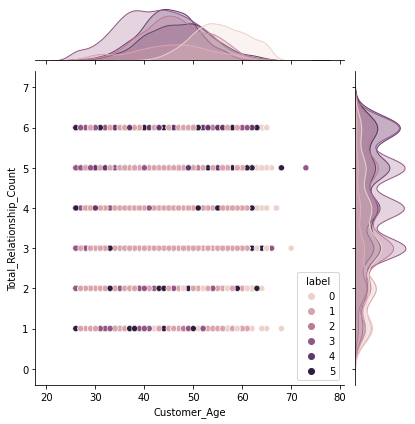

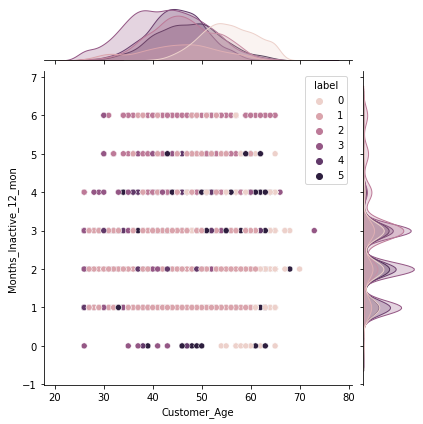

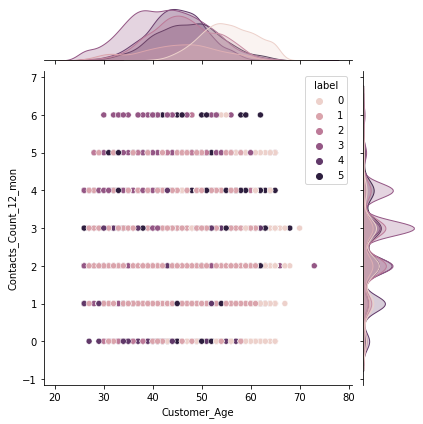

...

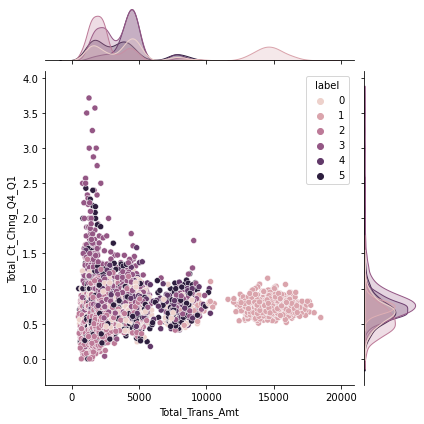

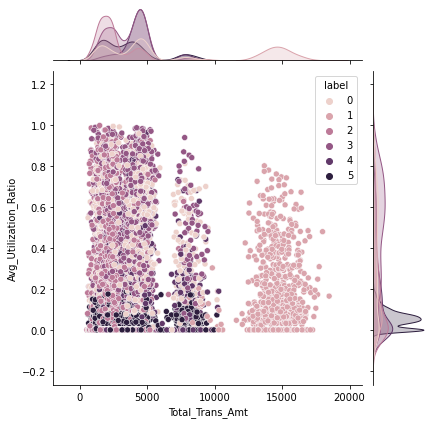

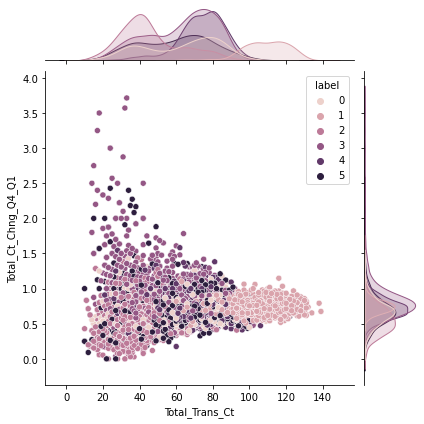

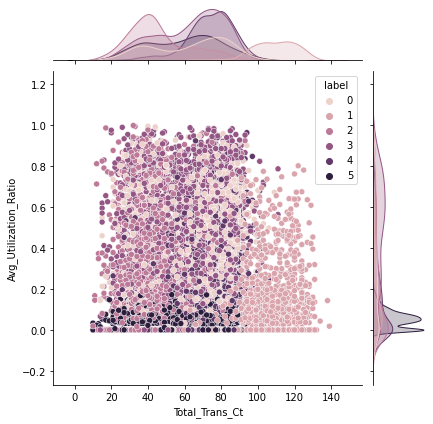

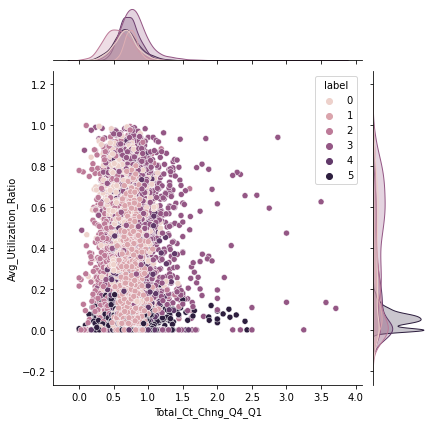

In [109]:
for ft1, ft2 in itertools.combinations(num_features, 2):
    sns.jointplot(data=churn1, x=ft1, y=ft2, hue='label')
    plt.show()

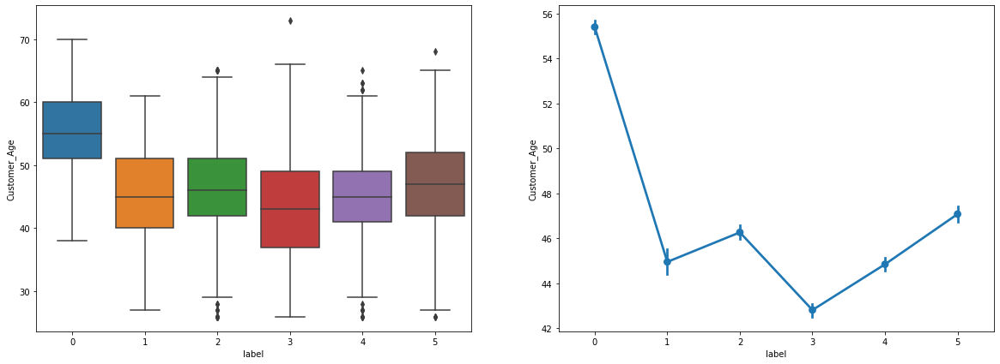

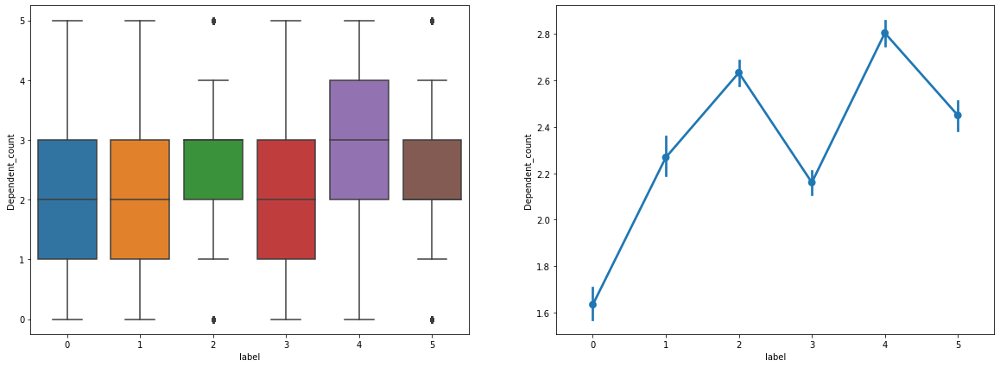

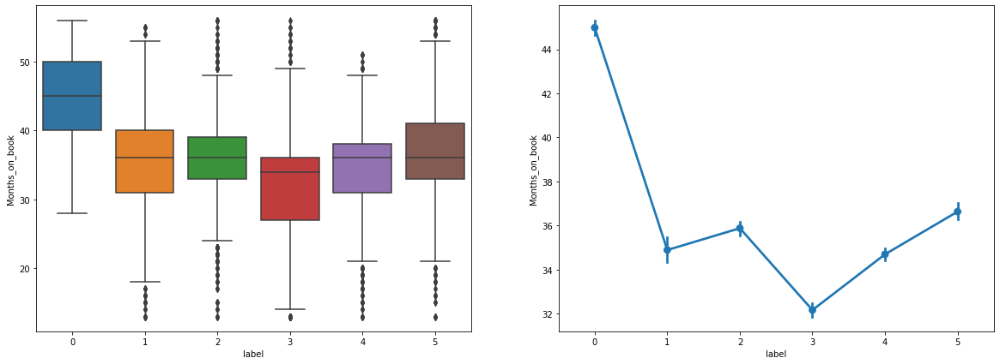

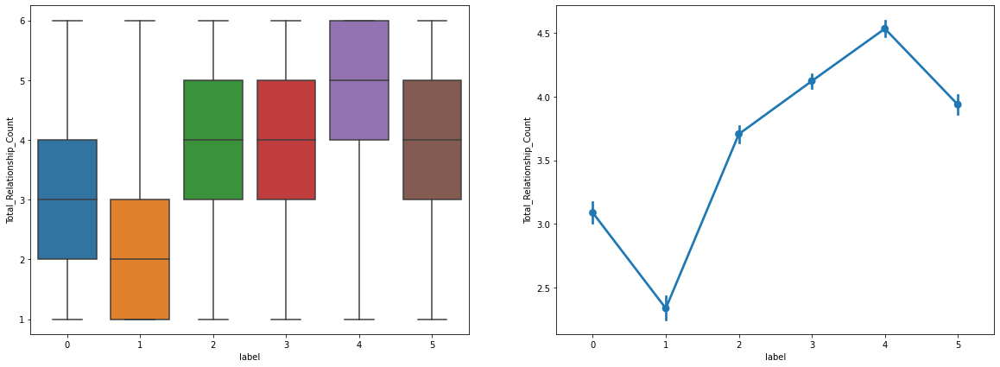

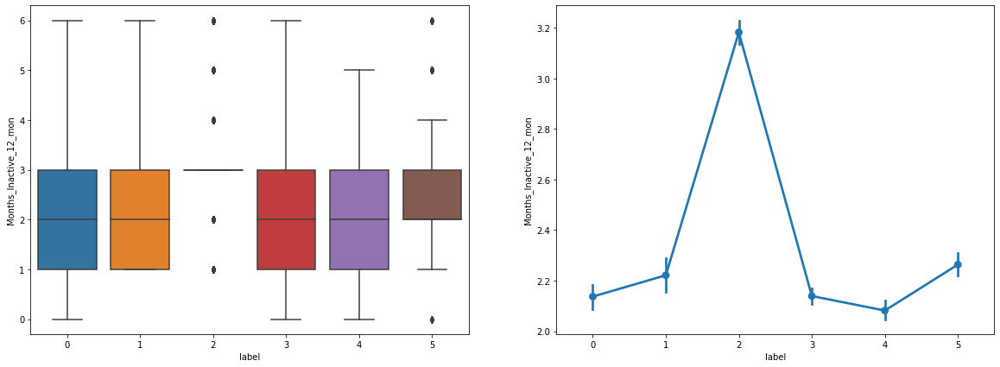

...

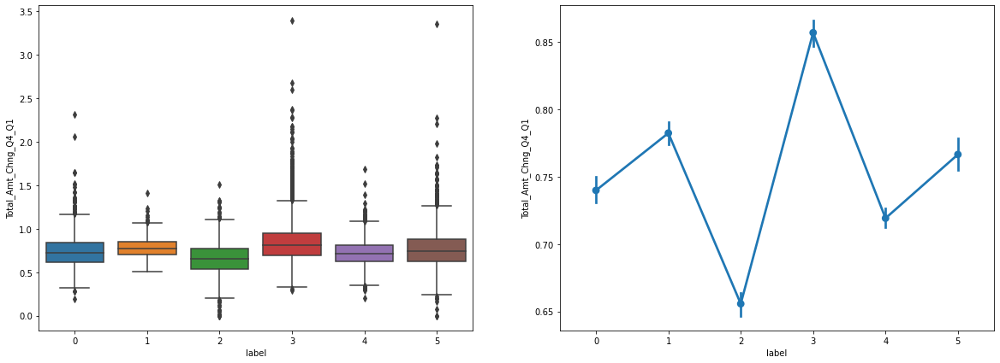

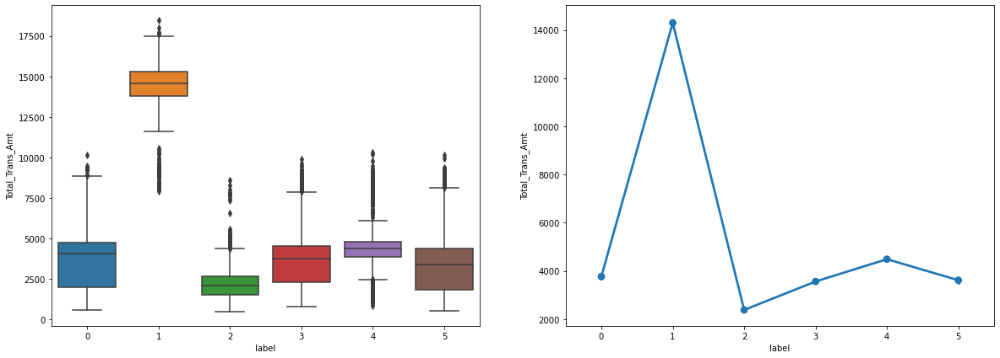

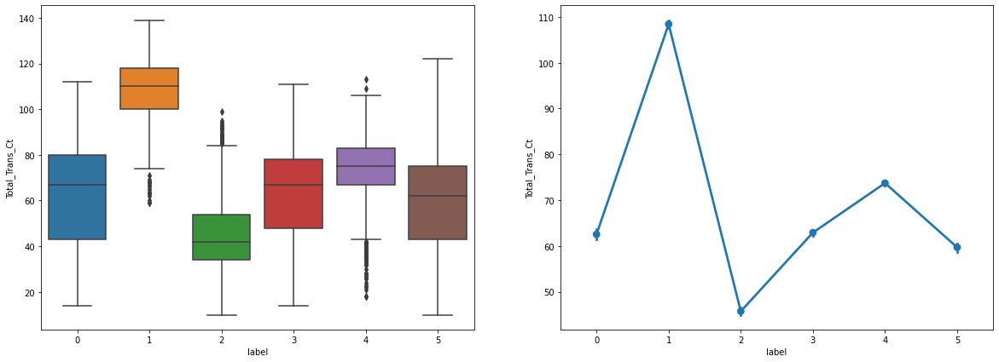

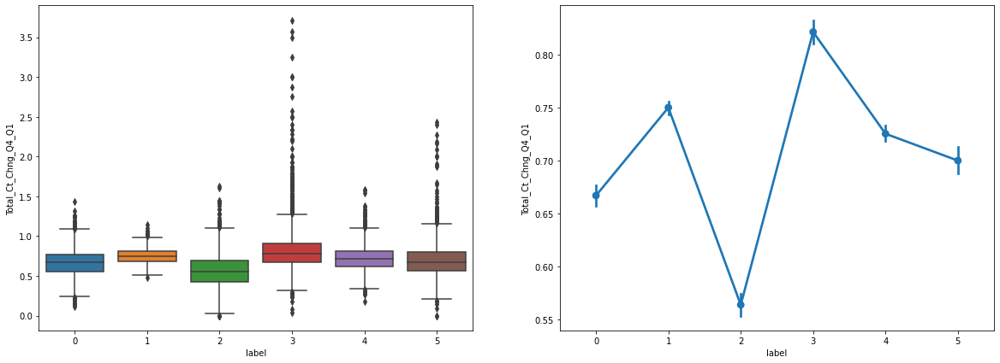

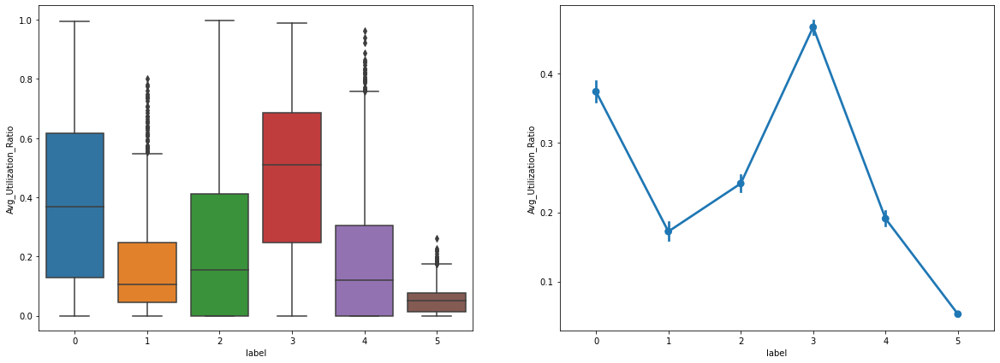

In [110]:
for ft in num_features:
    fig, axs = plt.subplots(1,2, figsize=(20, 7))
    sns.boxplot(data=churn1, x='label', y=ft, ax=axs[0])
    sns.pointplot(data=churn1, x='label', y=ft, ax=axs[1])
    plt.show()

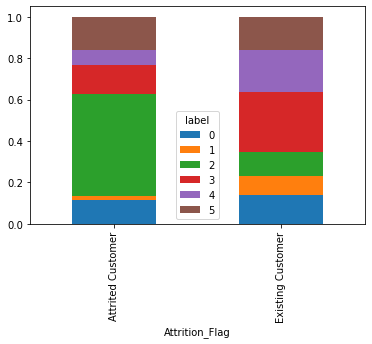

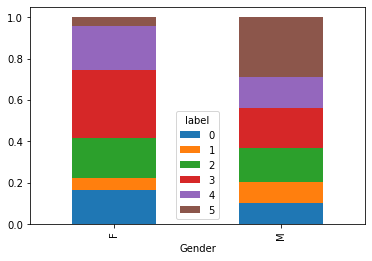

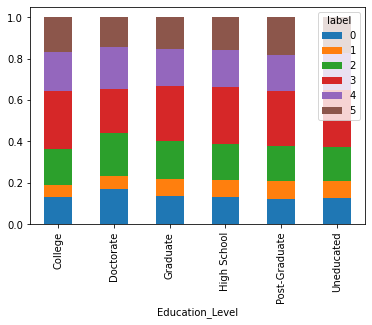

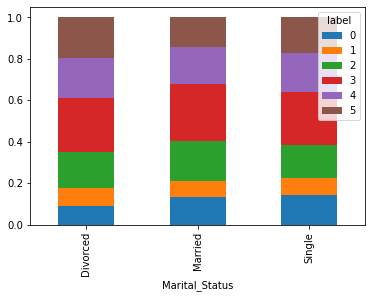

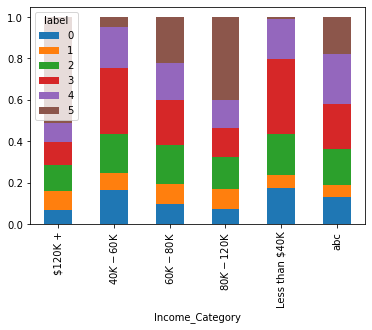

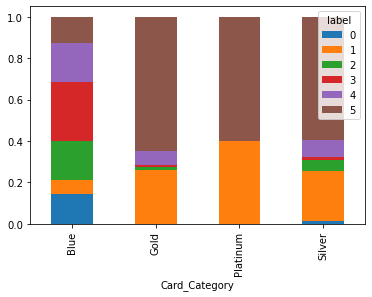

In [111]:
for ft in churn.select_dtypes('object').columns:
    ct = pd.crosstab(index=churn1[ft], columns=churn1['label'], normalize='index')
    ct.plot(kind='bar', stacked=True)

B. Clustering Dengan PCA + KModes

(4) Pisahkan fitur numerik dan fitur kategorik dari data churn. Lakukan scaling pada fitur numerik (apabila belum dilakukan). Lakukan transformasi PCA (jumlah PC bebas) pada fitur numerik. Buat DataFrame yang menunjukkan vector unit (eigenvalue) tiap Principal Components/PC berupa pasangan fitur dan koefisien. (Optional) Beri warna berbeda untuk koefisien fitur > 0.4, < -0.4 untuk tiap eigenvalue > menunjukkan fitur yang pengaruhnya besar pada PC tersebut.

In [119]:
X_num_scaled.drop('label', axis=1, inplace=True)
X_num_scaled.head()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,-0.090909,0.5,0.333333,0.5,-1.0,1.0,0.956476,-0.350175,0.988927,2.627193,-1.065558,-0.694444,3.911017,-0.239583
1,0.272727,1.5,0.888889,1.0,-1.0,0.0,0.435477,-0.289123,0.459078,3.530702,-1.008702,-0.944444,12.762712,-0.147917
2,0.454545,0.5,0.000000,0.0,-1.0,-2.0,-0.132863,-0.895439,-0.006562,8.149123,-0.778186,-1.305556,6.911017,-0.366667
3,-0.545455,1.0,-0.222222,-0.5,2.0,-1.0,-0.145198,0.870877,-0.313785,2.934211,-1.055115,-1.305556,6.911017,1.216667
4,-0.545455,0.5,-1.666667,0.5,-1.0,-2.0,0.019618,-0.895439,0.145527,6.311404,-1.192419,-1.083333,7.618644,-0.366667


(5) Buat model cluster KMeans atau KMedoids berdasarkan hasil transformasi PCA. Tentukan jumlah k dengan bantuan elbow method dan Sillhoette Score.

In [113]:
pca = PCA(n_components=4)

In [120]:
churn_pca = pd.DataFrame(pca.fit_transform(X_num_scaled), columns=['PCA1', 'PCA2', 'PCA3', 'PCA4'])
churn_pca.head()

,PCA1,PCA2,PCA3,PCA4
0,0.014151,0.689157,4.610806,-0.143243
1,-0.134756,-1.571966,11.012606,-2.107754
2,-0.512108,-2.090656,10.155912,-1.994407
3,-1.321105,-1.549123,6.598380,-1.509813
4,-0.560050,-1.796762,10.105575,-0.535430


In [121]:
def color(val):
    if val > 0.4:
        return 'background: skyblue'
    if val < -0.4:
        return 'background: pink'

In [122]:
pd.DataFrame(pca.components_.T, columns= ['PC1', 'PC2', 'PC3', 'PC4'], index=X_num_scaled.columns).style.applymap(color)

,PC1,PC2,PC3,PC4
Customer_Age,-0.020721,0.052510,-0.127723,-0.502789
Dependent_count,0.034984,0.001597,0.014388,0.064006
Months_on_book,-0.020462,0.065157,-0.163525,-0.641756
Total_Relationship_Count,-0.142236,0.157693,0.157042,0.004482
Months_Inactive_12_mon,-0.037709,0.054787,-0.169822,-0.212148
Contacts_Count_12_mon,-0.063840,0.268081,-0.205591,0.513905
Credit_Limit,0.551776,0.396426,0.090257,-0.038524
Total_Revolving_Bal,0.000334,-0.055284,0.053006,-0.024643
Avg_Open_To_Buy,0.550298,0.404635,0.081174,-0.034311
Total_Amt_Chng_Q4_Q1,0.030890,-0.102440,0.595305,0.000134


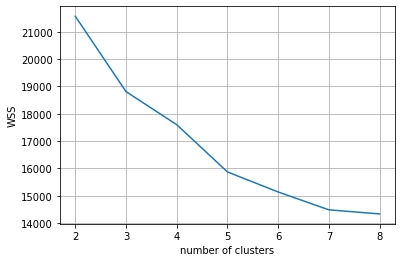

In [123]:
#memperkirakan jumlah klaster dengan within sums of squared terkecil
wss = []
n_clust = [2, 3, 4, 5, 6, 7, 8]
for clust in n_clust:
    kmed = KMedoids(n_clusters=clust)
    kmed.fit(churn_pca)
    wss.append(kmed.inertia_)
#buat plot wss terhadap penambahan klaster
sns.lineplot(x=n_clust, y=wss)
plt.xlabel('number of clusters')
plt.ylabel('WSS')
plt.grid()
plt.show()

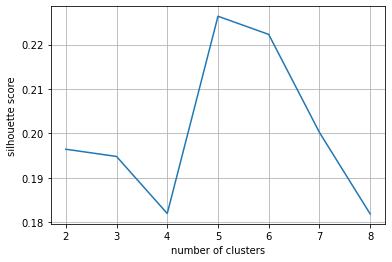

In [126]:
#memperkirakan jumlah klaster dengan sillhouetter score paling mendekati 1
#nilai ss menyatakan kekompakan klaster yang terbentuk
ss = []
n_clust = [2, 3, 4, 5, 6, 7, 8]
for clust in n_clust:
    kmed = KMedoids(n_clusters=clust)
    kmed.fit(churn_pca)
    ss.append(silhouette_score(churn_pca, kmed.labels_))
#buat plot silhouette score terhadap penambahan klaster
sns.lineplot(x=n_clust, y=ss)
plt.xlabel('number of clusters')
plt.ylabel('silhouette score')
plt.grid()
plt.show()

In [127]:
kmed_pca = KMedoids(n_clusters=5)
kmed_pca.fit(churn_pca)

KMedoids(n_clusters=5)

(6) Pada DataFrame hasil transformasi PCA, tambahkan kolom label dari hasil clustering. Lakukan EDA pada hasil clustering data dengan transformasi PCA dalam bentuk: <p>
(a) joint plot untuk tiap pasangan principal component dengan hue cluster label <p>
(b) tuliskan minimal 2 insights dari EDA yang Anda lakukan

In [130]:
churn_pca['label'] = kmed_pca.labels_
churn_pca.head()

,PCA1,PCA2,PCA3,PCA4,label
0,0.014151,0.689157,4.610806,-0.143243,0
1,-0.134756,-1.571966,11.012606,-2.107754,0
2,-0.512108,-2.090656,10.155912,-1.994407,0
3,-1.321105,-1.549123,6.598380,-1.509813,0
4,-0.560050,-1.796762,10.105575,-0.535430,0


In [134]:
pcs = churn_pca.columns[churn_pca.columns != 'label']

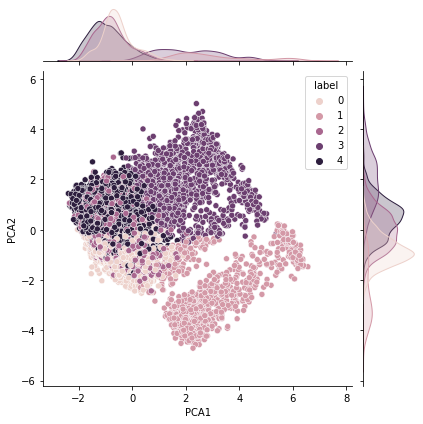

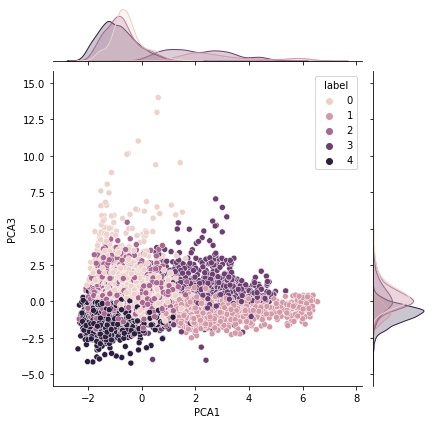

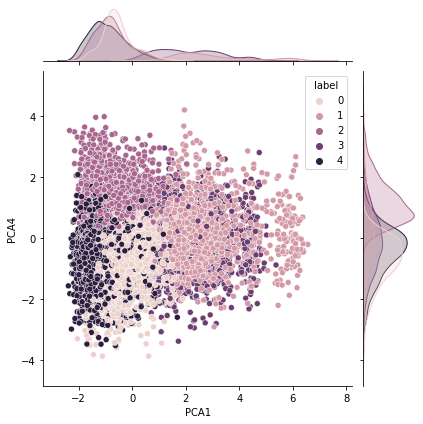

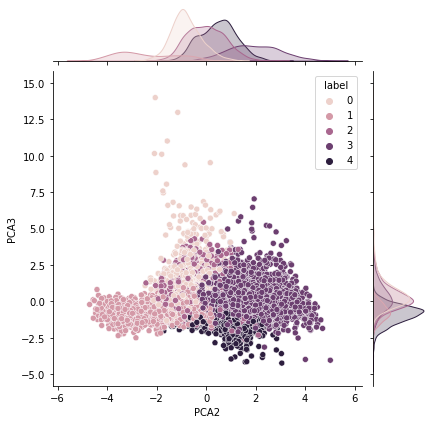

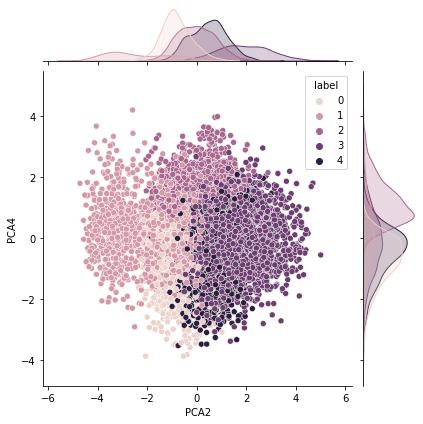

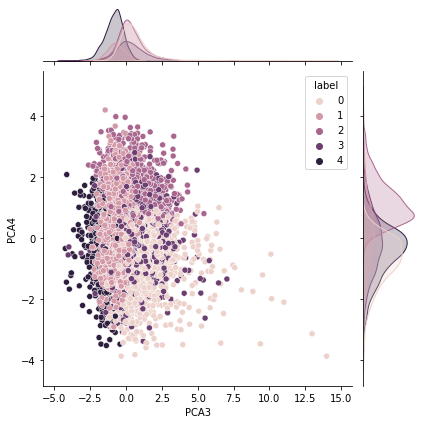

In [135]:
for pc1, pc2 in itertools.combinations(pcs, 2):
    sns.jointplot(data=churn_pca, x=pc1, y=pc2, hue='label')
    plt.show()

(7) Buat model cluster KModes untuk fitur kategorikal (jumlah k bebas). 

In [136]:
kmodes = KModes(n_clusters=5)

In [138]:
X_obj_transformed.head()

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
0,1.0,1.0,3.0,1.0,2.0,0.0
1,1.0,0.0,2.0,2.0,4.0,0.0
2,1.0,1.0,2.0,1.0,3.0,0.0
3,1.0,0.0,3.0,1.0,4.0,0.0
4,1.0,1.0,5.0,1.0,2.0,0.0


In [139]:
kmodes.fit(X_obj_transformed)

KModes(n_clusters=5, n_init=1)

In [142]:
X_obj_transformed['label_mod'] = kmodes.labels_
X_obj_transformed.head()

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,label_mod
0,1.0,1.0,3.0,1.0,2.0,0.0,3
1,1.0,0.0,2.0,2.0,4.0,0.0,0
2,1.0,1.0,2.0,1.0,3.0,0.0,3
3,1.0,0.0,3.0,1.0,4.0,0.0,0
4,1.0,1.0,5.0,1.0,2.0,0.0,3


(8) Tambahkan kolom label berdasarkan hasil clustering. Lakukan EDA:<p>
(a) FacetGrid: col = label, plot = countplot (1 fitur kategorik buat 1 FacetGrid)<p>
(b) Stacked barplot yang membandingkan proporsi kategori untuk tiap label (1 fitur kategorik buat 1 stacked barplot)<p>
(c) tuliskan minimal 2 insights dari EDA yang Anda lakukan

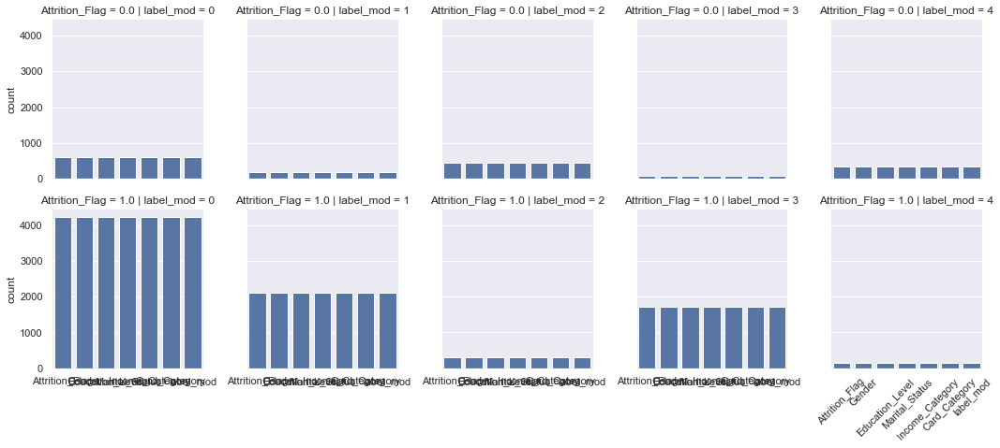

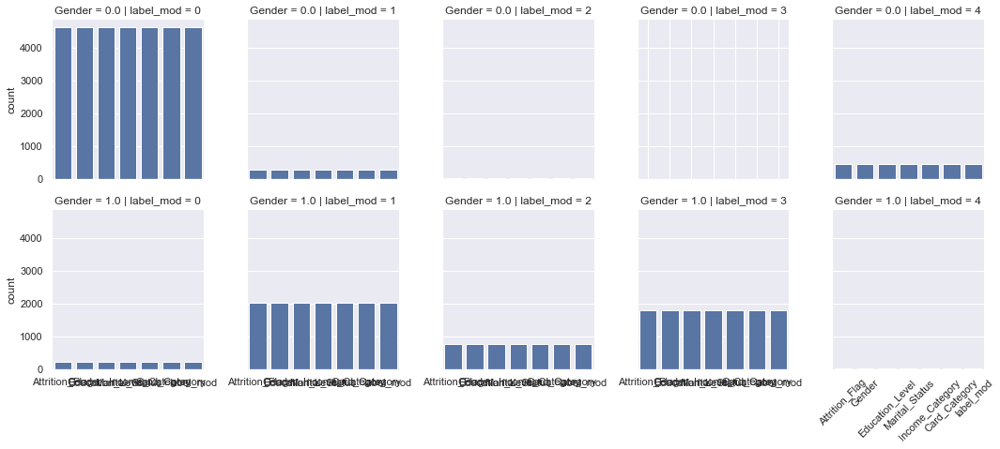

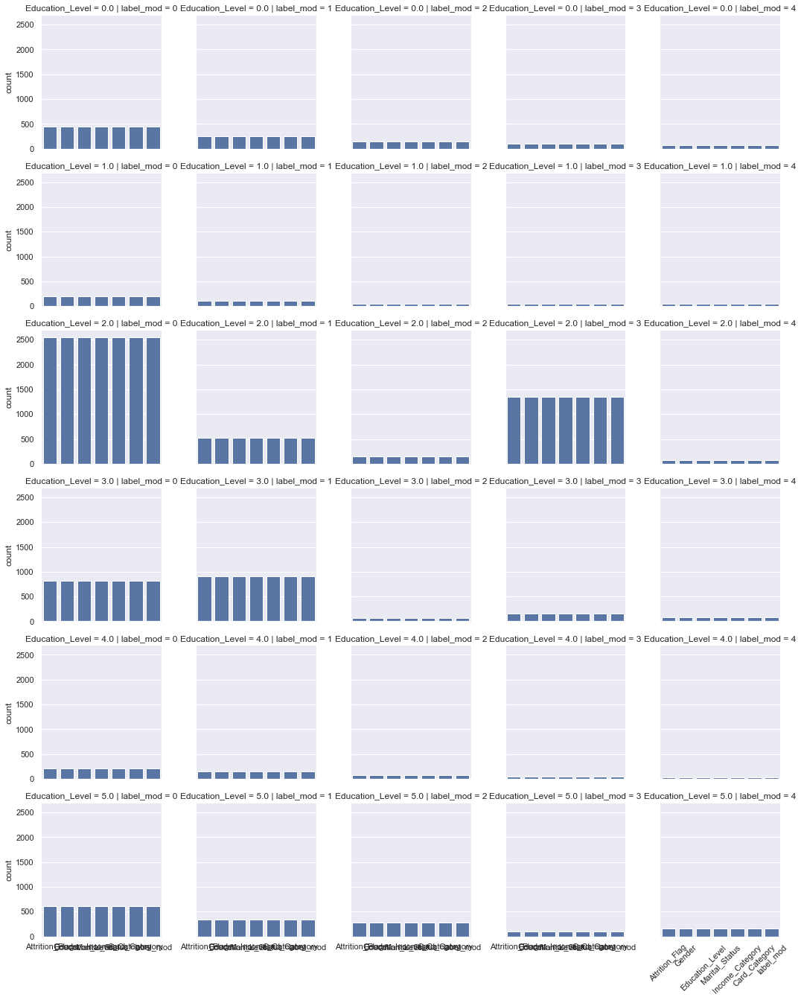

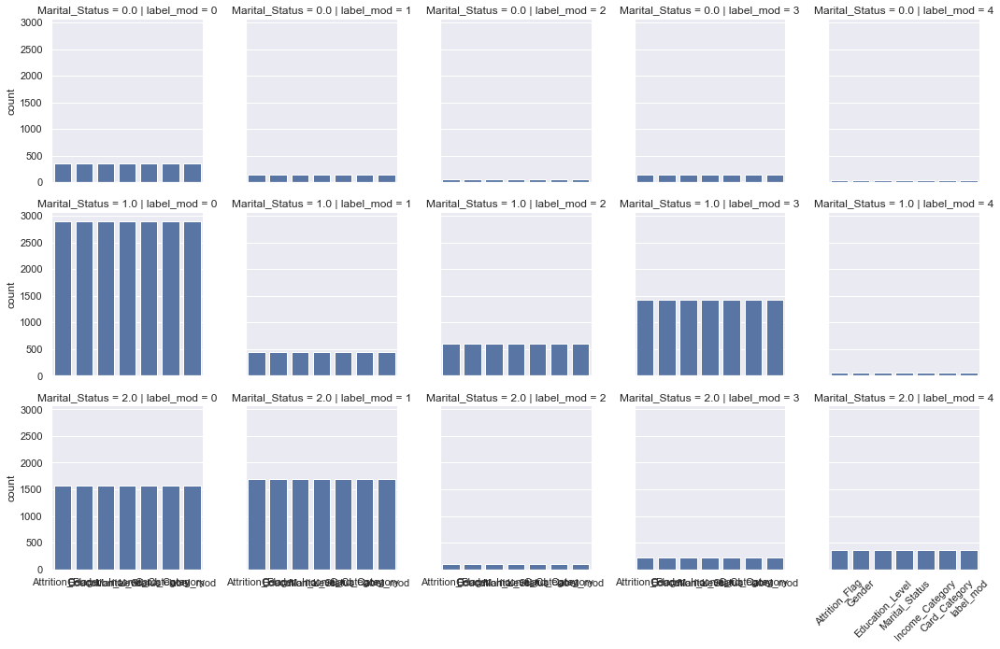

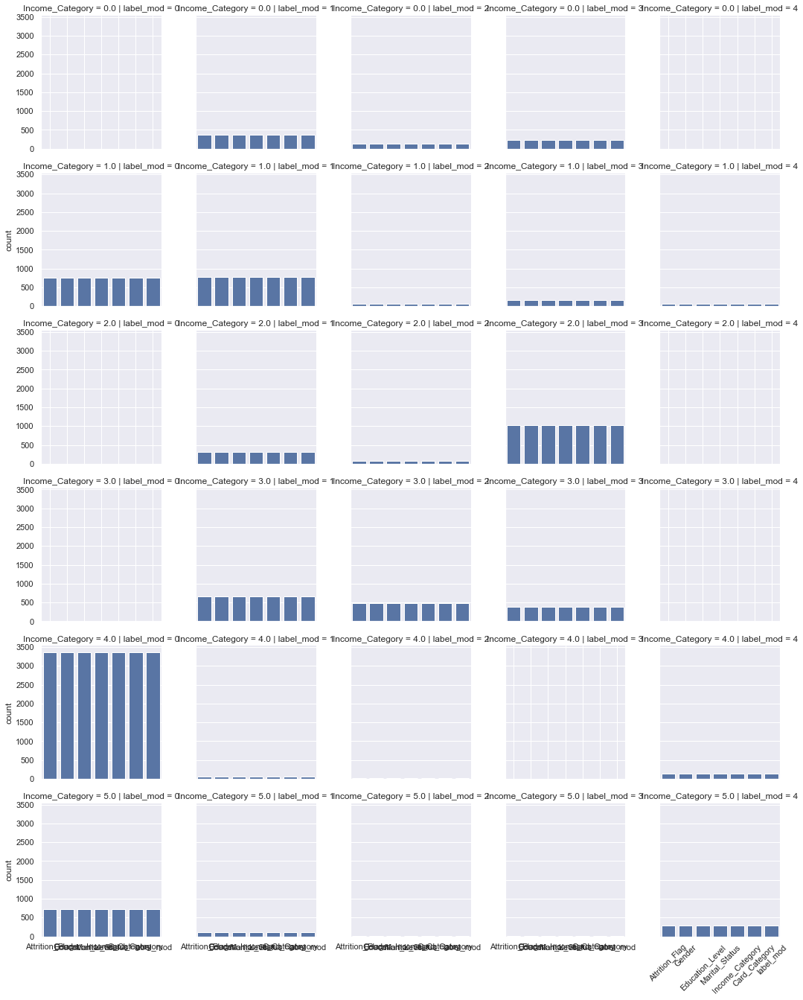

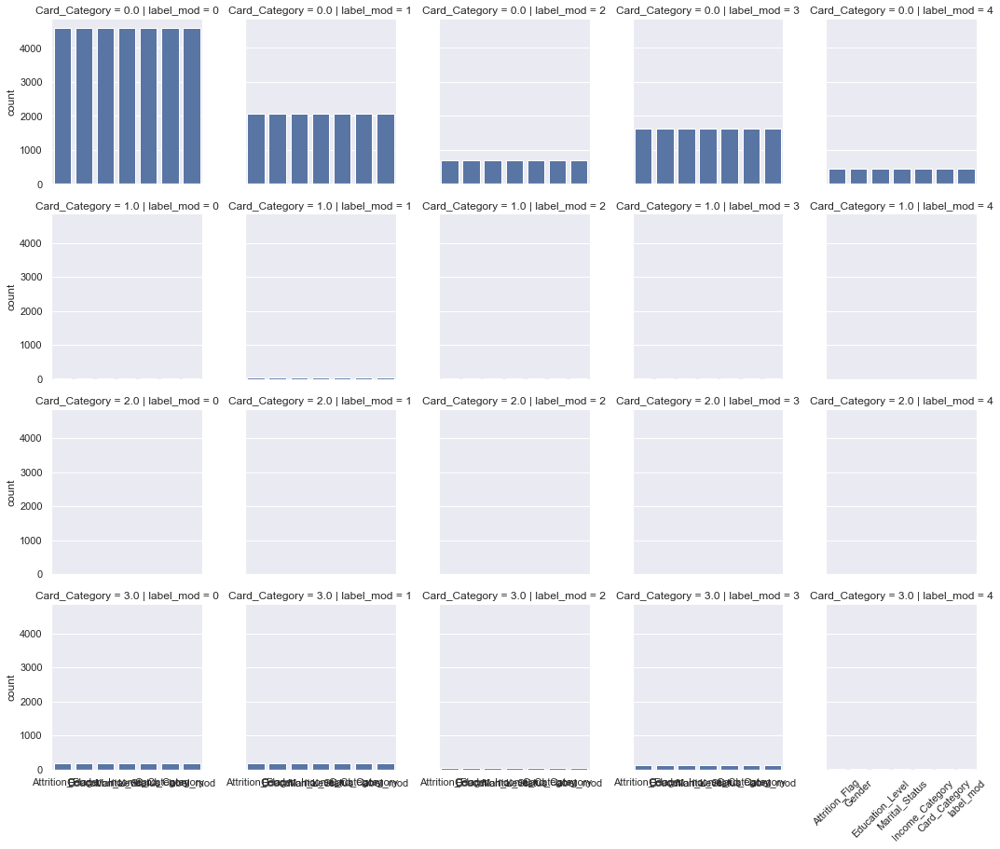

In [151]:
for ft in X_obj.columns:
    sns.set(font_scale=1)
    fg = sns.FacetGrid(data=X_obj_transformed, row=ft, col='label_mod')
    fg.map_dataframe(sns.countplot)
    plt.xticks(rotation=45)
    plt.show()

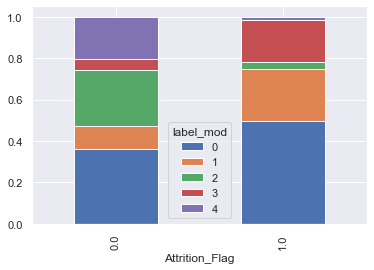

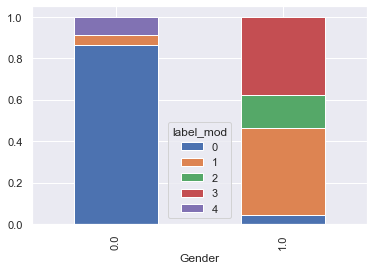

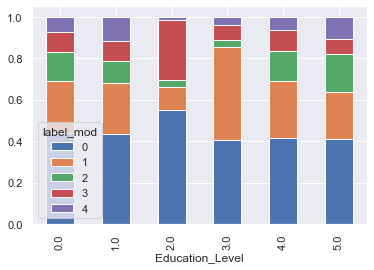

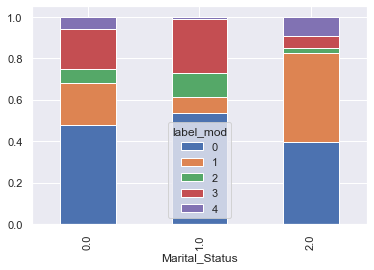

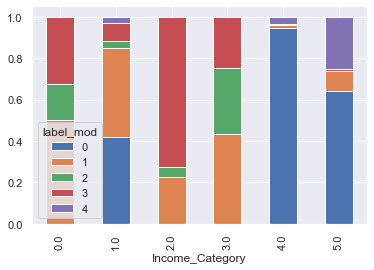

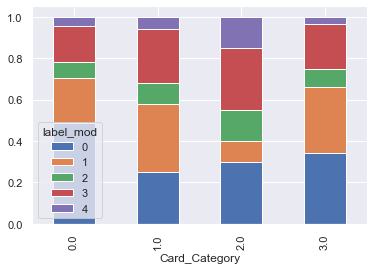

In [152]:
for ft in churn.select_dtypes('object').columns:
    ct = pd.crosstab(index=X_obj_transformed[ft], columns=X_obj_transformed['label_mod'], normalize='index')
    ct.plot(kind='bar', stacked=True)

(9) Kombinasikan 2 label untuk tiap row (label dari clustering paska PCA + label dari KModes). Misalnya dalam bentuk ab (a=label paska PCA, b=label KModes). Misalnya ada row yang punya label 14 artinya row ini termasuk cluster 1 berdasarkan fitur numeriknya, dan cluster 4 berdasarkan fitur kategoriknya.<p>
(a) Ada berapa label cluster unik yang terbentuk dari kombinasi 2 label?<p>
(b)  Tuliskan deskripsi minimal 2 kombinasi label.<p>
Misalnya:<p> 
cluster label 11: kebanyakan terdiri dari nasabah yang telah menikah dan memiliki PC 1 credit limit yang cenderung tinggi<p>
cluster label 04: kebanyakan terdiri dari nasabah yang memiliki kartu platinum dan memiliki utilization ratio yang cenderung rendah<p>


In [154]:
churn_pca.shape

(10127, 5)

In [155]:
X_obj_transformed.shape

(10127, 7)

In [181]:
churn1['label_new'] = X_obj_transformed['label_mod']*10 + churn_pca['label']
churn1['label_new'].value_counts()

0     1567
2     1385
4     1372
13     589
12     532
14     464
33     460
10     437
34     409
32     397
1      361
30     325
23     269
11     254
24     227
44     218
31     207
3      143
22     135
42     124
20      71
40      61
43      56
21      56
41       8
Name: label_new, dtype: int64

In [182]:
churn1.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,label,label_new
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,3,30
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,3,0
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,3,30
3,Existing Customer,40,F,4,High School,Married,Less than $40K,Blue,34,3,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,3,0
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,3,30


(10) Menurut Anda, apakah transformasi PCA diperlukan apabila objektif dari clusteringnya adalah segmentasi nasabah untuk memudahkan pembuatan keputusan bisnis untuk masing-masing segmen?

perlu, karena dengan PCA data akan lebih mudah divisualisasikan dan dapat dikomunikasikan lebih mudah untuk mendukung pembuatan keputusan